# <a name="0">Hierarchical Clustering</a>

### **Table of Contents**:
1. <a href="#0">Read the dataset</a>
2. <a href="#2">Data investigation</a>
3. <a href="#3">Data preprocessing </a>
4. <a href="#4">Features transformation </a>
5. <a href="#5">K means</a>
6. <a href="#5">Training datasets</a>
7. <a href="#6">Improvement ideas</a>



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
# from sklearn.impute import SimpleImputer
import seaborn as sns
# from matplotlib import rcParams
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.decomposition import KernelPCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.decomposition import PCA, KernelPCA
from sklearn import preprocessing

## 1. <a name="1">Read the dataset</a>
(<a href="#0">Go to top</a>)

First dowmload the data set from this link https://www.kaggle.com/code/sadkoktaybicici/credit-card-data-clustering-k-mean/data
then import it in python.

| Column Name                     | Description                                                                                                               |
|---------------------------------|---------------------------------------------------------------------------------------------------------------------------|
| CUST_ID                          | Customer ID                                                                                      |
| BALANCE                         | Remaining the balance amount in their account for purchases                                                                   |
| BALANCE_FREQUENCY               | How frequently the balance is updated, scored between 0 and 1 (1 = frequently updated, 0 = not frequently updated)      |
| PURCHASES                       | Amount of purchases made from the account                                                                                 |
| ONEOFF_PURCHASES                 | Maximum purchase amount done in one-go                                                                                    |
| INSTALLMENTS_PURCHASES           | Amount of purchases done in installment                                                                                   |
| CASHADVANCE                     | Cash in advance given by the user                                                                                         |
| PURCHASES_FREQUENCY              | How frequently purchases are being made, scored between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)|
| ONEOFF_PURCHASES_FREQUENCY        | How frequently one-off purchases are being made, scored between 0 and 1 (1 = frequently made, 0 = not frequently made)   |
| PURCHASES_INSTALLMENTS_FREQUENCY  | How frequently installment purchases are being made, scored between 0 and 1 (1 = frequently done, 0 = not frequently done)|
| CASH_ADVANCE_FREQUENCY            | How frequently cash in advance is being taken                                                                             |
| CASH_ADVANCE_TRX                  | Number of transactions made with "Cash Advance"                                                                           |
| PURCHASES_TRX                    | Number of purchase transactions                                                                                           |
| CREDIT_LIMIT                     | Credit limit for the user                                                                                                 |
| PAYMENTS                        | Amount of payments done by the user                                                                                       |
| MINIMUM_PAYMENTS                | Minimum amount of payments done by the user                                                                               |
| PRCFULL_PAYMENT                  | Percentage of full payment paid by the user                                                                               |
| TENURE                          | Duration of credit card service for the user                                                                              |

In [3]:
#read the data

data_path = 'CC GENERAL.csv'  #the path where you downloaded the data
df = pd.read_csv(data_path)

print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 18)


## 2. <a name="2">Data investigation</a>
(<a href="#0">Go to top</a>)

in this part you need to check the data quality and assess any issues in the data as:
- null values in each column 
- each column has the proper data type
- outliers
- duplicate rows
- distribution for each column (skewness)
<br>

**comment each issue you find** 

In [4]:
# Let's see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [5]:
round(df.isnull().sum(axis=0)*100/df.shape[0],2)

CUST_ID                             0.00
BALANCE                             0.00
BALANCE_FREQUENCY                   0.00
PURCHASES                           0.00
ONEOFF_PURCHASES                    0.00
INSTALLMENTS_PURCHASES              0.00
CASH_ADVANCE                        0.00
PURCHASES_FREQUENCY                 0.00
ONEOFF_PURCHASES_FREQUENCY          0.00
PURCHASES_INSTALLMENTS_FREQUENCY    0.00
CASH_ADVANCE_FREQUENCY              0.00
CASH_ADVANCE_TRX                    0.00
PURCHASES_TRX                       0.00
CREDIT_LIMIT                        0.01
PAYMENTS                            0.00
MINIMUM_PAYMENTS                    3.50
PRC_FULL_PAYMENT                    0.00
TENURE                              0.00
dtype: float64

- There are null values in MINIMUM_PAYMENTS and CREDIT_LIMIT

In [6]:
# This will print basic statistics for numerical columns
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


- There is Skewness in the data

In [7]:
# feel free to investigate what you want
# check duplicates
df.duplicated().sum()

0

In [8]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12



This case requires to develop a customer segmentation to define marketing strategy. The
sample Dataset summarizes the usage behavior of about 9000 active credit card holders during the last 6 months. The file is at a customer level with 18 behavioral variables.

Following is the Data Dictionary for Credit Card dataset :-

- __CUST_ID__ : Identification of Credit Card holder (Categorical)
- __BALANCE__ : Balance amount left in their account to make purchases
- __BALANCE_FREQUENCY__ : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
- __PURCHASES__ : Amount of purchases made from account
- __ONEOFF_PURCHASES__ : Maximum purchase amount done in one-go
- __INSTALLMENTS_PURCHASES__ : Amount of purchase done in installment
- __CASH_ADVANCE__ : Cash in advance given by the user
- __PURCHASES_FREQUENCY__ : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
- __ONEOFFPURCHASESFREQUENCY__ : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
- __PURCHASESINSTALLMENTSFREQUENCY__ : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
- __CASHADVANCEFREQUENCY__ : How frequently the cash in advance being paid
- __CASHADVANCETRX__ : Number of Transactions made with "Cash in Advanced"
- __PURCHASES_TRX__ : Numbe of purchase transactions made
- __CREDIT_LIMIT__ : Limit of Credit Card for user
- __PAYMENTS__ : Amount of Payment done by user
- __MINIMUM_PAYMENTS__ : Minimum amount of payments made by user
- __PRCFULLPAYMENT__ : Percent of full payment paid by user
- __TENURE__ : Tenure of credit card service for user

In [9]:
obj_cols = df.select_dtypes(include=['object']).columns.tolist()
num_cols = df.select_dtypes(exclude=['object']).columns.tolist()
print(num_cols)

['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']


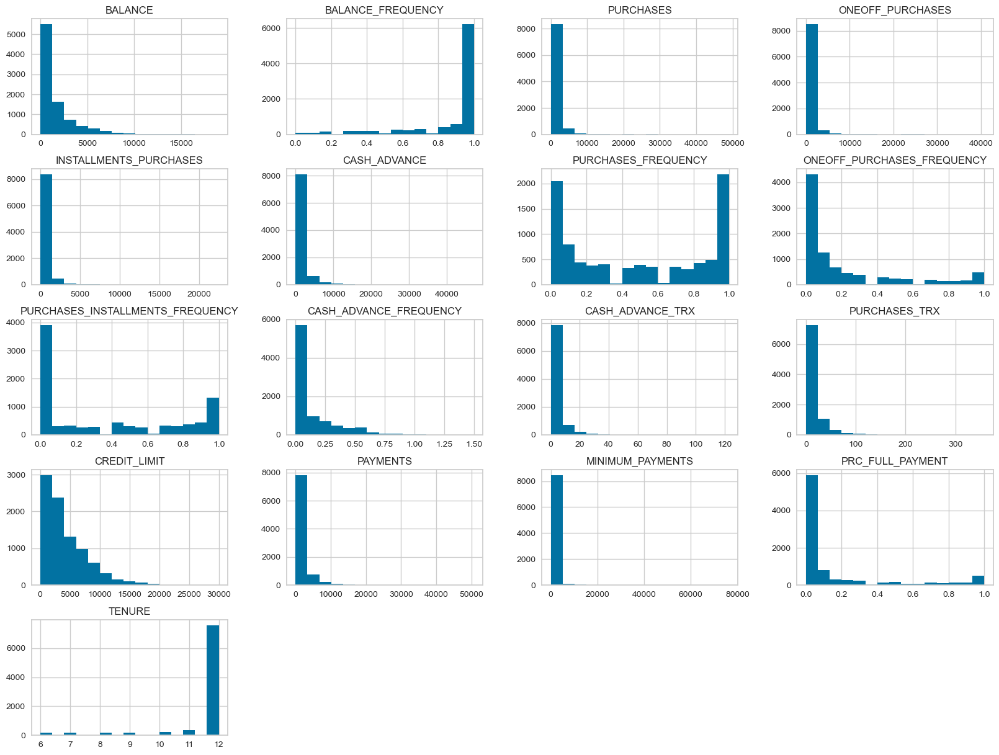

In [10]:
# Histogram
df[num_cols].hist(bins=15, figsize=(20, 15), layout=(5, 4));

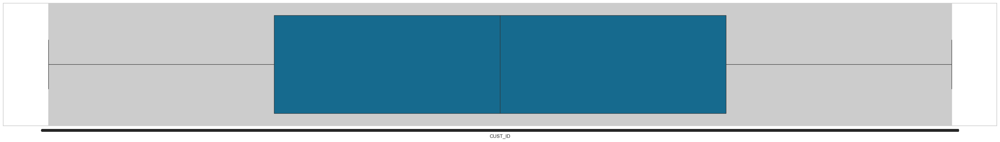

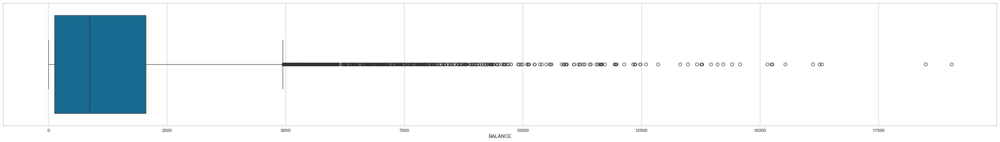

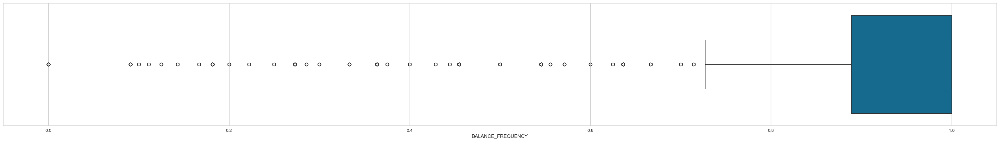

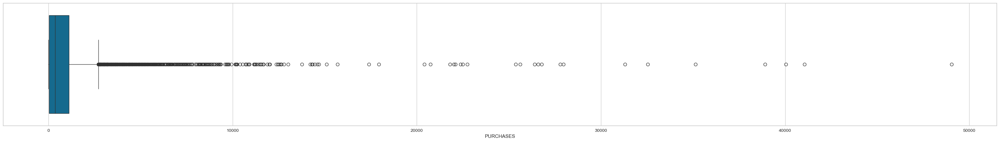

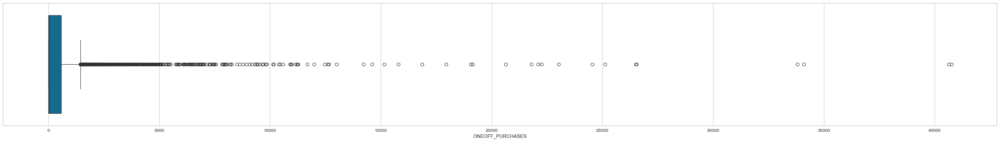

...

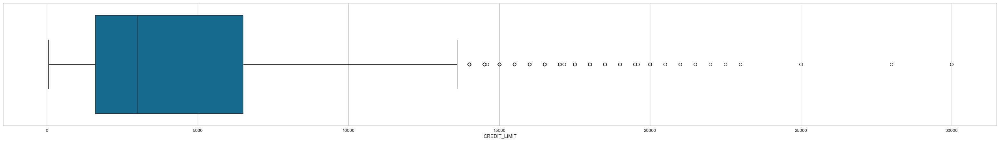

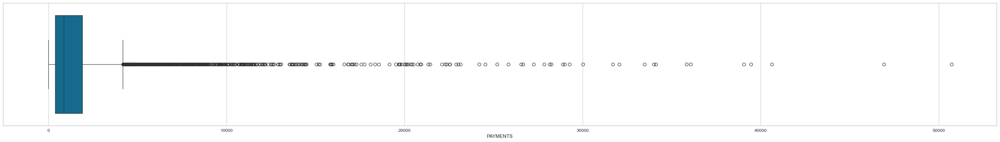

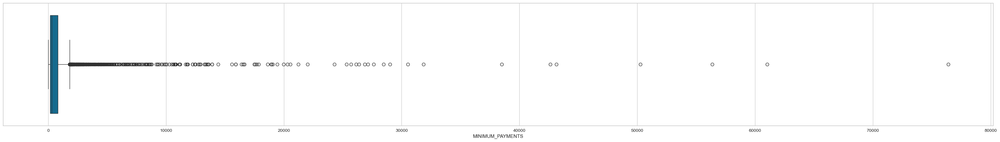

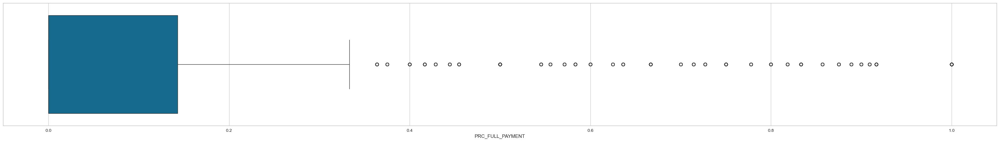

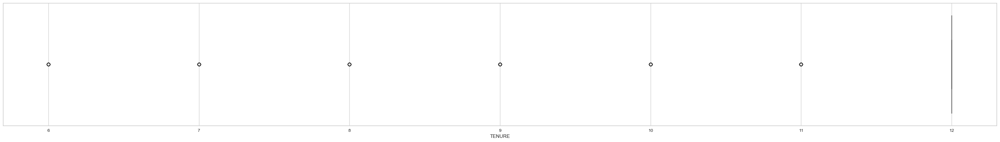

In [11]:
# Box Plot
for column in df.columns:
    plt.figure(figsize=(40,5)) 
    sns.boxplot(x=df[column])
    plt.show()

- Too many outliers, so deleting these outliers is not recommended. If the number of outliers were less, we could delete the outliers. We will avoid deleting outlier records here. What we can do here based on the column description is to normalize the data and handle the skewness using log transformations or power transformers.

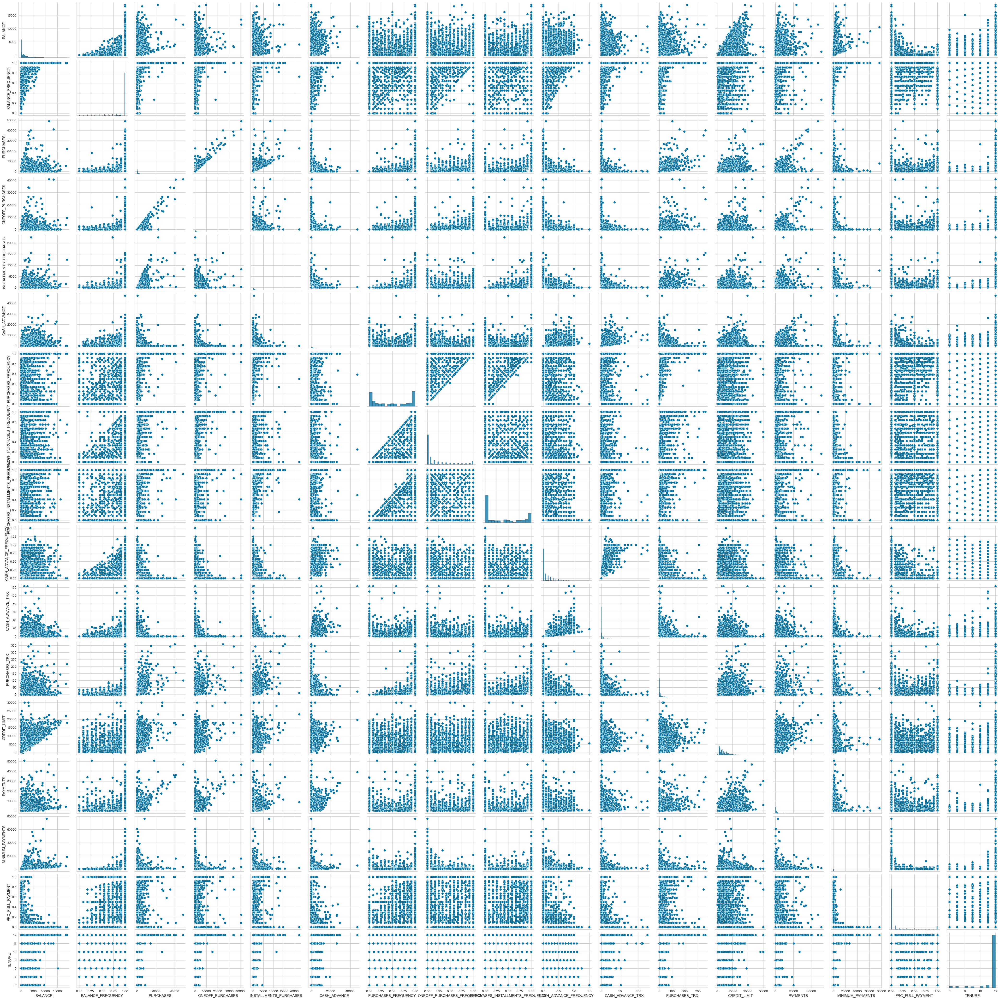

In [12]:
# Pair Plot
sns.pairplot(df)
plt.show()

- As the credit limit increases, the balance increases, so there is a linear relationship.
- As the number of purchases increases, the number of "upfront" transactions decreases
- Since the credit balance is low, purchases, one-time and installment purchases are less common.
- Purchases, one-time purchases, and installment purchases are all linearly related.

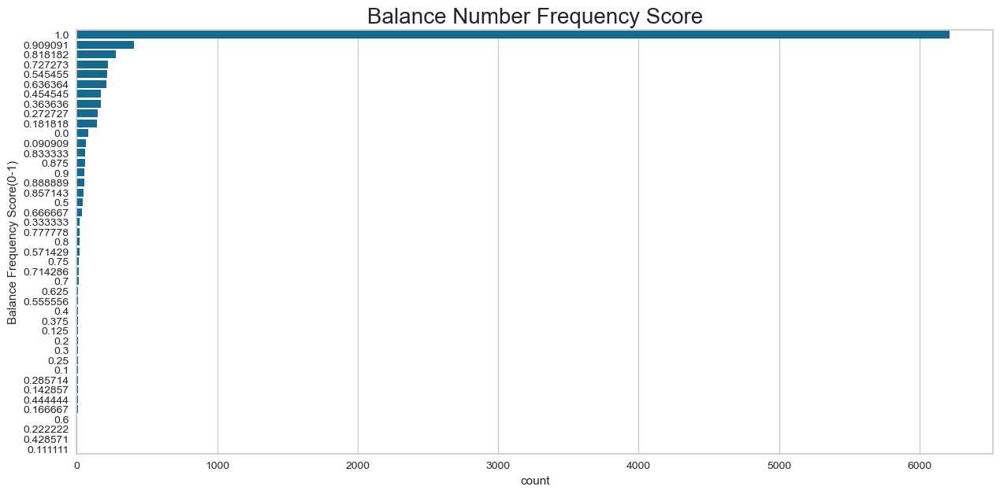

In [13]:
plt.rcParams['figure.figsize'] = (15,7)

sns.countplot(y=df['BALANCE_FREQUENCY'],order = df['BALANCE_FREQUENCY'].value_counts().index)
plt.ylabel('Balance Frequency Score(0-1)')
plt.title('Balance Number Frequency Score', fontsize=20)
plt.show()

- Balance frequency is a score of 0-1 given to accounts based on how often account balances are updated. One is to be the highest score. So it's basically a measure of how often people use their credit cards. As we can see here, most of the accounts have a score, the best score, meaning that most people use their credit card frequently and only a small number of people keep their cards relatively inactive.

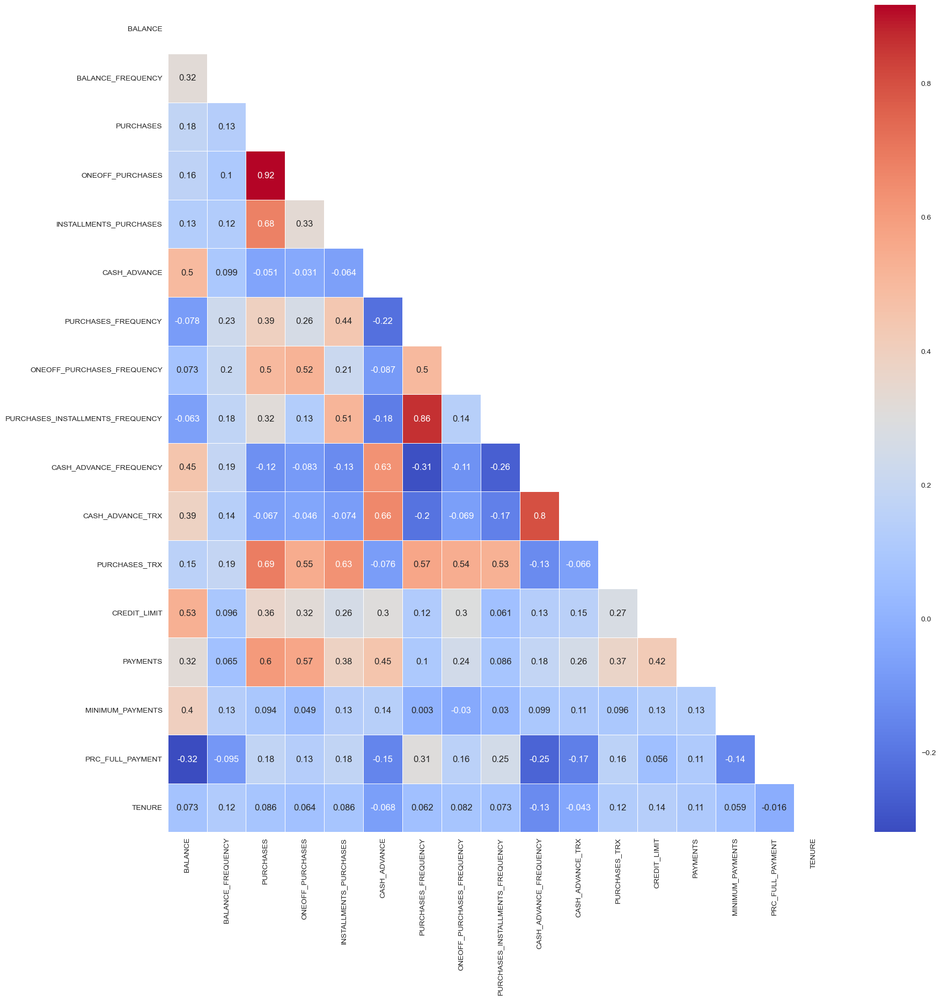

In [14]:
# Set figure size
plt.figure(figsize=(20, 20))

# Compute correlation matrix
corr_data = df.corr()

# Create a mask to hide the upper triangle
mask = np.triu(np.ones_like(corr_data, dtype=bool))

# Plot the heatmap with the mask
sns.heatmap(corr_data, mask=mask, annot=True, cmap='coolwarm', linewidths=.5)

# Show the plot
plt.show()

- High correlation between PURCHASES and ONEOFF_PURCHASES

## 3. <a name="3">Data preprocessing</a>
(<a href="#0">Go to top</a>)


### Define below all the issues that you had found in the previous part
1- Null values in 2 columns <br>
2- unuseful column: Customer_ID <br>
3- Correlated columns <br>
4- Skewness in the data <br>

In [15]:
#make a copy for the original dataset
df_copy=df.copy()

### for each issue adapt this methodology 
- start by defining the solution
- apply this solution onn the data
- test the solution to make sure that you have solved the issue

**Drop Null Values**

In [16]:
#solution 
df_copy.dropna(inplace=True)

In [17]:
#test 
round(df_copy.isnull().sum(axis=0)*100/df.shape[0],2)

CUST_ID                             0.0
BALANCE                             0.0
BALANCE_FREQUENCY                   0.0
PURCHASES                           0.0
ONEOFF_PURCHASES                    0.0
INSTALLMENTS_PURCHASES              0.0
CASH_ADVANCE                        0.0
PURCHASES_FREQUENCY                 0.0
ONEOFF_PURCHASES_FREQUENCY          0.0
PURCHASES_INSTALLMENTS_FREQUENCY    0.0
CASH_ADVANCE_FREQUENCY              0.0
CASH_ADVANCE_TRX                    0.0
PURCHASES_TRX                       0.0
CREDIT_LIMIT                        0.0
PAYMENTS                            0.0
MINIMUM_PAYMENTS                    0.0
PRC_FULL_PAYMENT                    0.0
TENURE                              0.0
dtype: float64

**Drop CUST_ID column**

In [18]:
#solution 
df_copy.drop('CUST_ID', axis=1, inplace=True)

In [19]:
#test 
df_copy.columns

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')

**Drop Very High correlated columns**

In [20]:
#solution 
df_copy.drop(columns=['ONEOFF_PURCHASES', 'CASH_ADVANCE_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY'], inplace=True)

In [21]:
#test 
df_copy.columns

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'INSTALLMENTS_PURCHASES',
       'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

**Skewness**

In [22]:
# return unbiased skew over requested axis Normalized by N-1.
df_copy.skew()

BALANCE                        2.374254
BALANCE_FREQUENCY             -2.084161
PURCHASES                      8.055789
INSTALLMENTS_PURCHASES         7.216133
CASH_ADVANCE                   5.139629
PURCHASES_FREQUENCY            0.033041
ONEOFF_PURCHASES_FREQUENCY     1.504234
CASH_ADVANCE_TRX               5.673327
PURCHASES_TRX                  4.578418
CREDIT_LIMIT                   1.507019
PAYMENTS                       5.873049
MINIMUM_PAYMENTS              13.622193
PRC_FULL_PAYMENT               1.886027
TENURE                        -3.011141
dtype: float64

In [23]:
# solution 
# Apply log transformation to the skewed features except the 'PURCHASES_FREQUENCY' and 'TENURE'
skewness_features = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'ONEOFF_PURCHASES_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT',
                     'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT']
df_copy[skewness_features] = np.log(df_copy[skewness_features]+0.001)

In [24]:
#test
df_copy.skew()

BALANCE                      -1.123253
BALANCE_FREQUENCY            -5.447919
PURCHASES                    -1.149258
INSTALLMENTS_PURCHASES       -0.212320
CASH_ADVANCE                  0.107865
PURCHASES_FREQUENCY           0.033041
ONEOFF_PURCHASES_FREQUENCY    0.049668
CASH_ADVANCE_TRX              0.135003
PURCHASES_TRX                -1.063531
CREDIT_LIMIT                 -0.107380
PAYMENTS                     -0.148483
MINIMUM_PAYMENTS              0.010860
PRC_FULL_PAYMENT              0.728987
TENURE                       -3.011141
dtype: float64

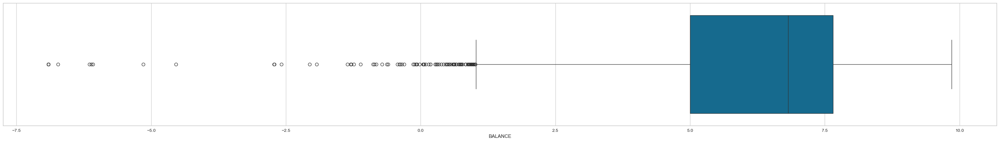

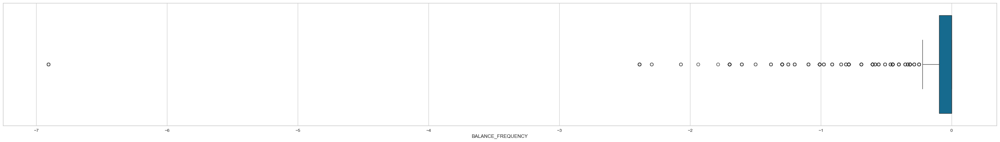

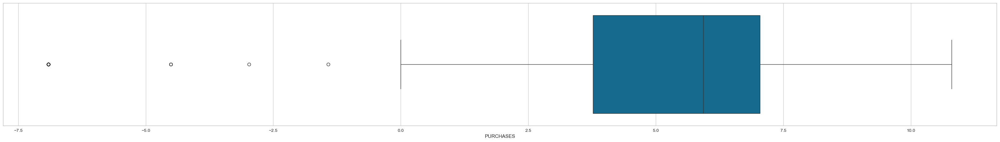

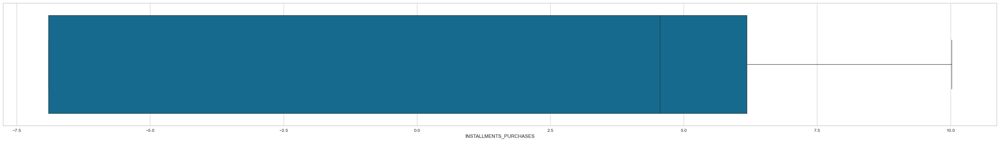

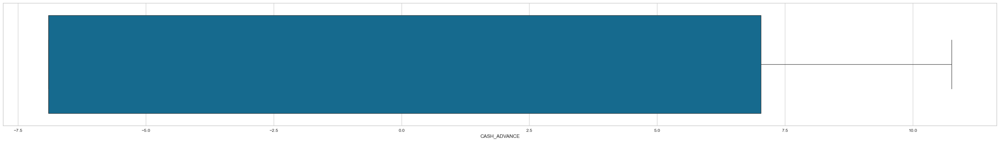

...

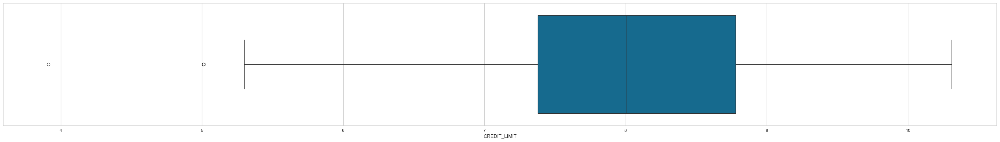

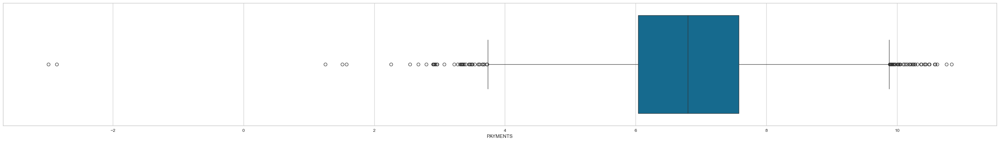

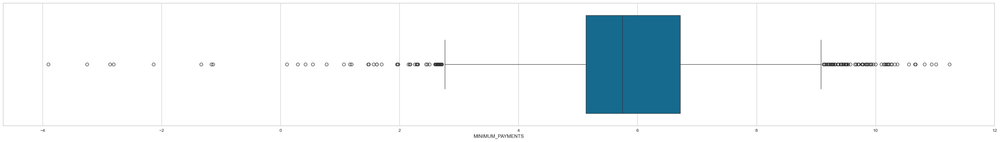

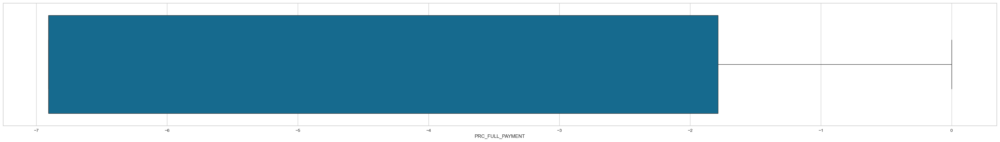

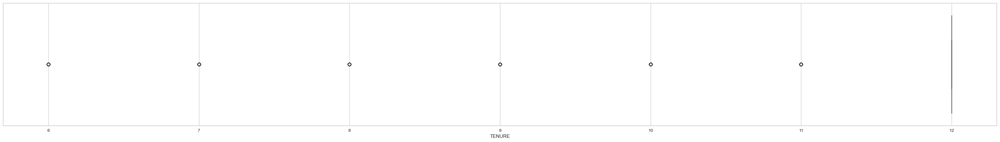

In [25]:
# Box Plot
for column in df_copy.columns:
    plt.figure(figsize=(40,5)) 
    sns.boxplot(x=df_copy[column])
    plt.show()

**Apply T-SNE**
- Visualize data and see the effect of each transformation on data

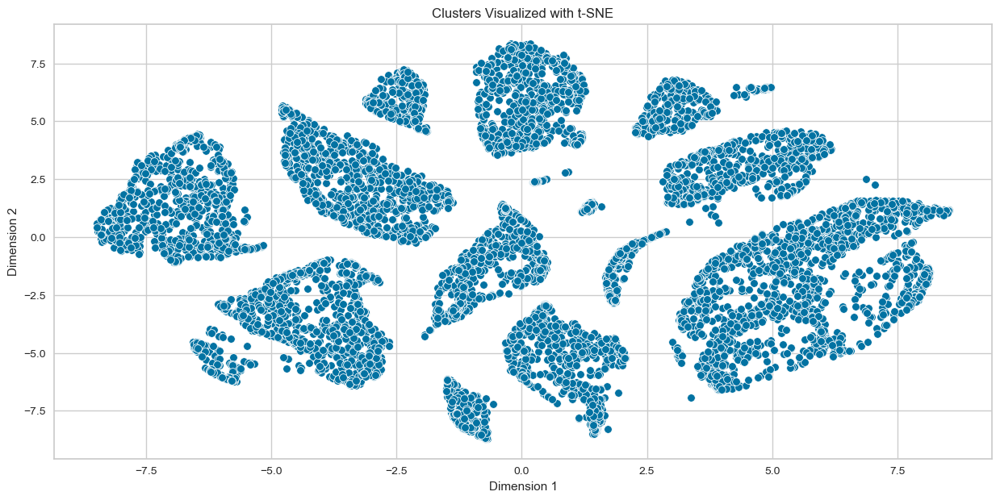

In [26]:
# Reduce the dimensions of the data using t-SNE for better visualization.
t_sne = TSNE(n_components=2,  perplexity=30, learning_rate=0.1, n_iter=2000)
X_tsne = t_sne.fit_transform(df_copy)

# Add the cluster information to the reduced data
df_tsne = pd.DataFrame(data=X_tsne, columns=['Dimension 1', 'Dimension 2'])

# Plotting
sns.scatterplot(x='Dimension 1', y='Dimension 2', data=df_tsne)
plt.title('Clusters Visualized with t-SNE')
plt.show()

## 4. <a name="4">Features transformation</a>
(<a href="#0">Go to top</a>)

*What is the feature scaling technique that would use and why?* <br>
*return to this section again and try another technique and see how that will impact your result*<br>
for more details on different methods for scaling check these links
- https://scikit-learn.org/stable/modules/preprocessing.html#preprocessing
- https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing
- https://www.analyticsvidhya.com/blog/2020/07/types-of-feature-transformation-and-scaling/

Answer here:

Feature techniques like scaling, normalization, and standardization, which involves transforming the data to make it more suitable for modeling.</br>
These techniques can help to improve model performance, reduce the impact of outliers, and ensure that the data is on the same scale.</br>

In [27]:
# Elbow method
n_clusters=15
cost=[]
for i in range(1,n_clusters):
    kmean= KMeans(i, n_init=50)
    kmean.fit(df_copy)
    cost.append(kmean.inertia_)  

Text(0, 0.5, 'Sum of Squared Error (WCSS)')

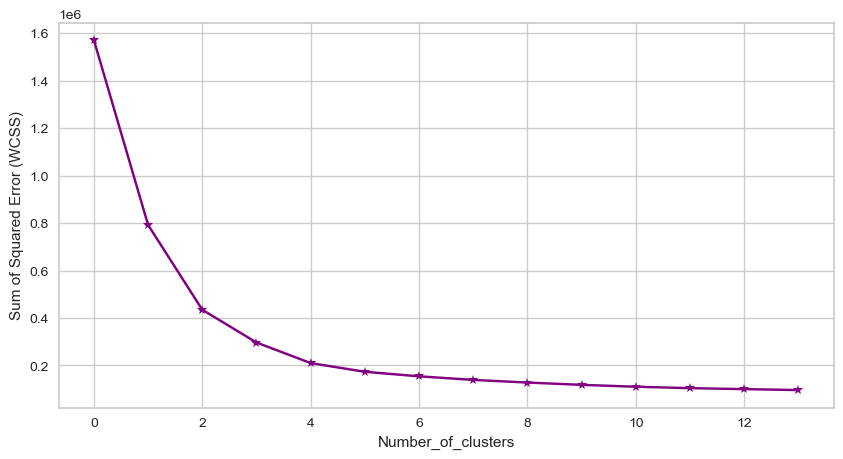

In [28]:
plt.figure(figsize=(10,5))
plt.plot(cost, marker = '*',color='purple')
plt.xlabel('Number_of_clusters')
plt.ylabel('Sum of Squared Error (WCSS)')

- From this curve, the optimal number of cluster is 5.

## 5. <a name="5">K Means</a>
(<a href="#5">Go to top</a>)

1- Use the k means class that you implemented in the previous task to cluster this data
2- Use http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html and see if the difference in the result
3- Use elbow method to determine the K (plot the result using two plot one for distorion and another for inertia)
4- (Optionally) make a method that pick the best number of clusters for you 
5- Using different techniques for scaling and comment on the result

In [29]:
## KMeans without PCA
# Number of clusters (K)
n_clusters = 5

# Instantiate the KMeans model
kmeans = KMeans(n_clusters=n_clusters )

# Fit the model to the scaled data
kmeans.fit(df_copy)

KMeans(n_clusters=5)

In [30]:
Clusters = kmeans.labels_
Clusters

array([0, 2, 4, ..., 0, 2, 3], dtype=int32)

<AxesSubplot: xlabel='Dimension 1', ylabel='Dimension 2'>

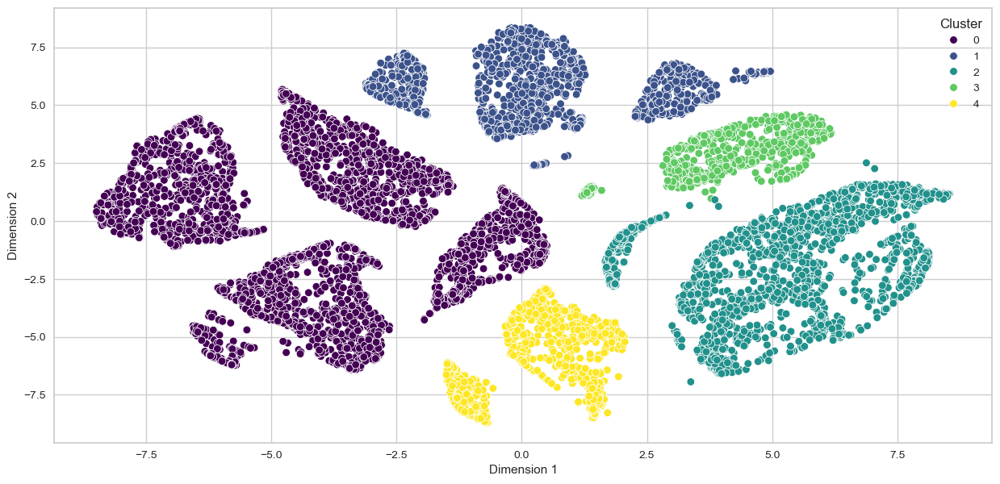

In [31]:
df_tsne['Cluster'] = kmeans.labels_
sns.scatterplot(x='Dimension 1', y='Dimension 2', 
                data=df_tsne, hue=df_tsne['Cluster'],palette='viridis')

In [32]:
silhouette_avg = silhouette_score(df_copy , kmeans.labels_)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.5758842956583096


## 6. <a name="5">Training and hyperparamter tuning</a>
(<a href="#0">Go to top</a>)


Before we start the training process we need to specify 3 paramters:<br>
1- Linkage criteria : The linkage criterion determines the distance between two clusters
    - Complete-Linkage Clustering
    - Single-Linkage Clustering
    - Average-Linkage Clustering
    - Centroid Linkage Clustering
2- Distance function:
    - Euclidean Distance 
    - Manhattan Distance 
    - Mahalanobis distance 
3- Number of clusters


### *Number of clusters*
Use Dendograms to specify the optimum number of clusters
- Compare how changing linkage criteria or distance function would affect the optimum number of clusters
- you can use silhouette_score or any other evalution method to help you determine the optimum number of clusters
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

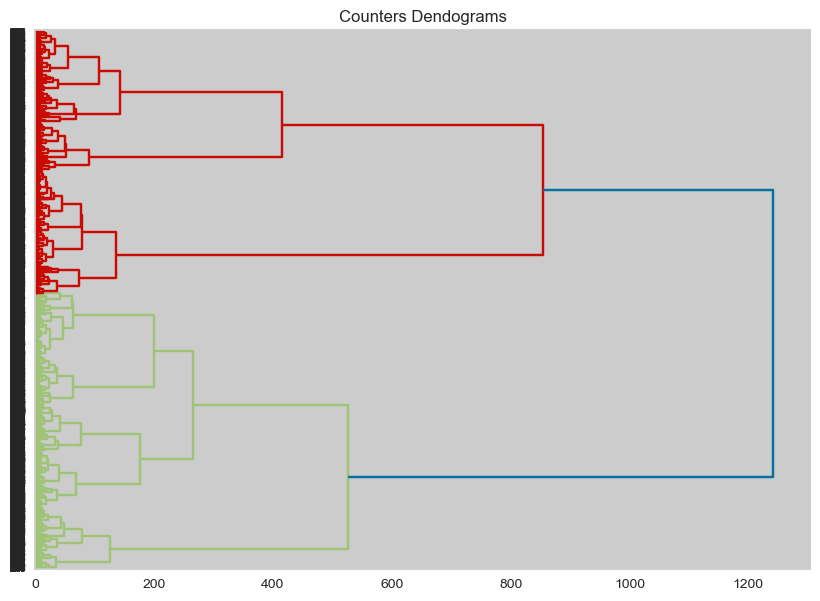

In [33]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))
plt.title("Counters Dendograms")
dend = shc.dendrogram(shc.linkage(y=df_copy , method='ward', metric='euclidean'),orientation='right')   #fill y with your dataframe
                                                                                                        #and method with linkage criteria
                                                                                                        #and metric with distance function

In [34]:
#training
# Number of clusters
n_clusters = 5

# AgglomerativeClustering model
hier_model = AgglomerativeClustering(n_clusters=n_clusters)
hier_model.fit(df_copy)

AgglomerativeClustering(n_clusters=5)

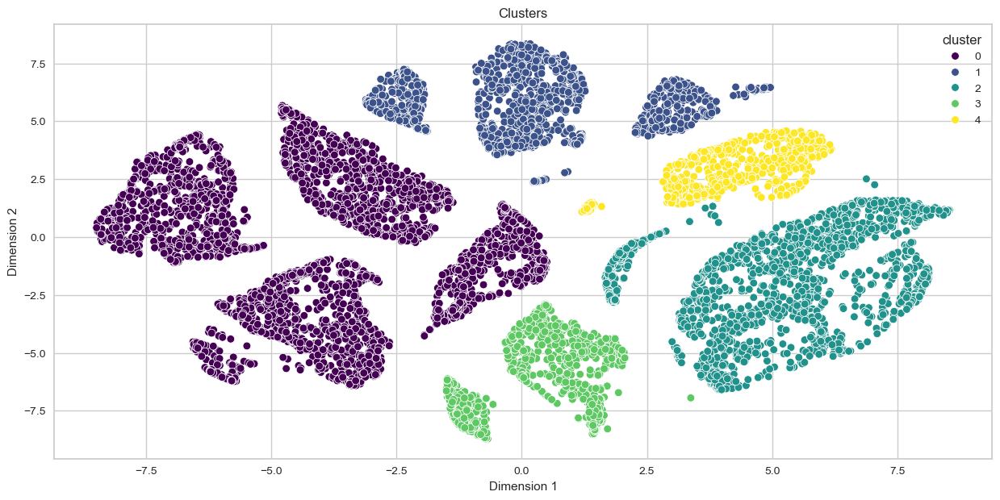

In [35]:
# Assign cluster labels to the t-SNE dataframe
df_tsne['cluster'] = hier_model.labels_

sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='cluster', data=df_tsne, palette='viridis')
plt.title('Clusters')
plt.show()

In [36]:
# GaussianMixture
n_clusters = 5

# GaussianMixture model
gaussian_model = GaussianMixture(n_components=n_clusters,covariance_type='full')
labels_ = gaussian_model.fit_predict(df_copy)

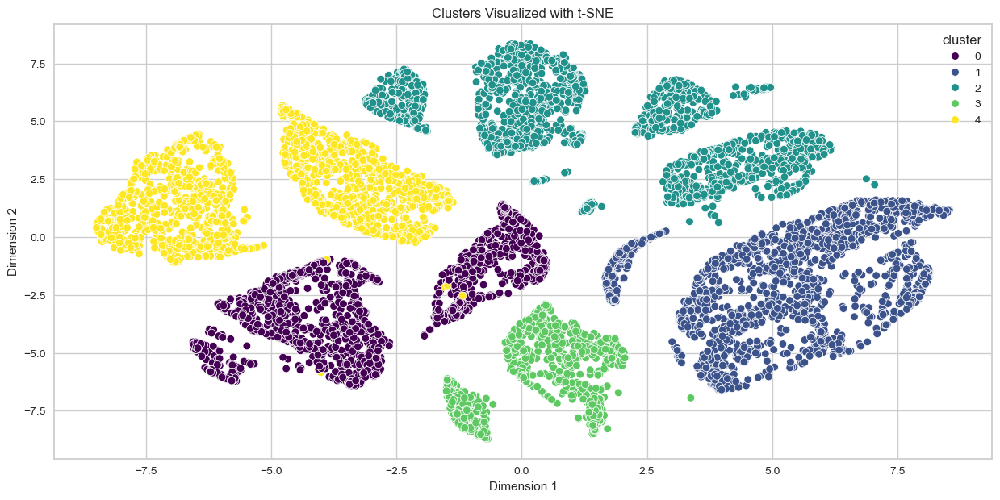

In [37]:
df_tsne['cluster'] = labels_

sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='cluster', data=df_tsne, palette='viridis')
plt.title('Clusters Visualized with t-SNE')
plt.show()

## 6. <a name="6">improvement ideas</a>
(<a href="#0">Go to top</a>)

- Try to use PCA to reduce the number of features and compare how this will affect the clustring process
- Try to run your code again but with different tranformation technique
- Implement gap statistics method and use it as evaluation metric and compare the result with what you did before https://www.datanovia.com/en/lessons/determining-the-optimal-number-of-clusters-3-must-know-methods/#gap-statistic-method 

## DBSCAN

In [38]:
# DBSCAN model
dbscan = DBSCAN(eps=2.6, min_samples=5).fit(df_copy)

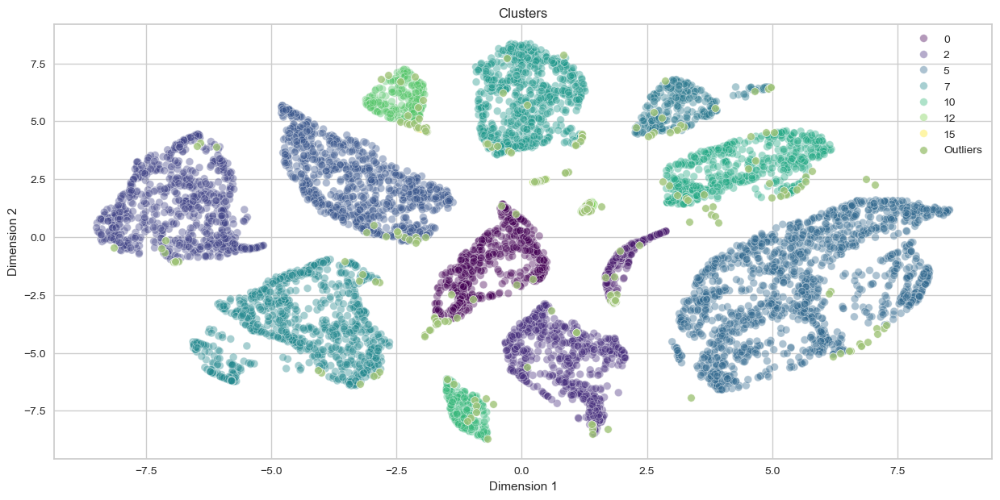

In [39]:
df_tsne['cluster'] = dbscan.labels_

outliers_mask = df_tsne['cluster'] == -1
df_tsne_without_outliers = df_tsne[~outliers_mask]

# Plot clusters
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='cluster', data=df_tsne_without_outliers, palette='viridis', alpha=0.4)

# Outliers
outliers_mask = df_tsne['cluster'] == -1
sns.scatterplot(x=df_tsne.loc[outliers_mask, 'Dimension 1'], 
                y=df_tsne.loc[outliers_mask, 'Dimension 2'], 
                label='Outliers', 
                alpha=0.8)

plt.title('Clusters')
plt.legend()
plt.show()

In [40]:
# Number of clusters (K)
n_clusters = 5

# Instantiate the KMeans model
kmeans = KMeans(n_clusters=n_clusters )

# Fit the model to the scaled data
kmeans.fit(df_copy)

KMeans(n_clusters=5)

## Kernel PCA

In [42]:
kernel_pca = KernelPCA(
    n_components=5, kernel="rbf", gamma=10, fit_inverse_transform=True, alpha=0.1
)

X_kernel_pca = kernel_pca.fit_transform(df_copy)

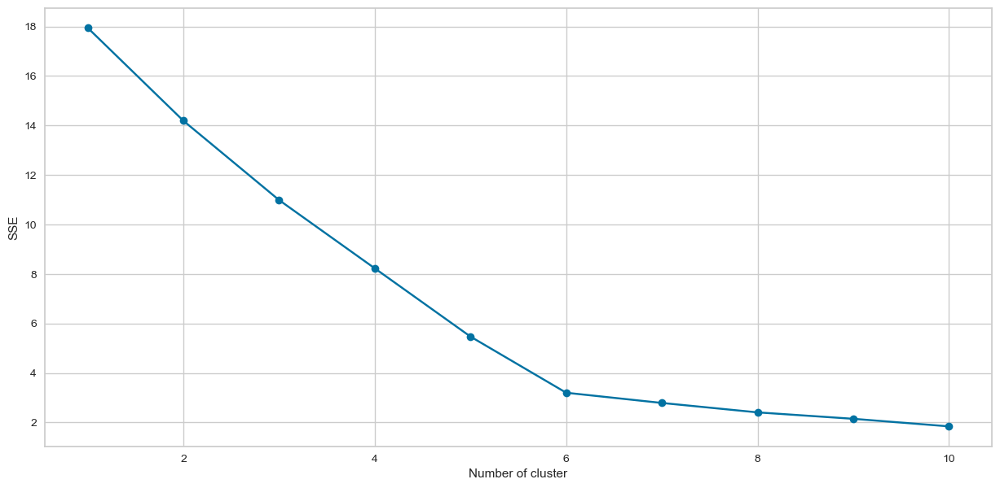

In [43]:
n_clusters = 10

inertias = []

for n_cluster in range(1 , n_clusters+1):

    kmean= KMeans(n_cluster, random_state=0)

    kmean.fit(X_kernel_pca)

    inertias.append(kmean.inertia_)

plt.plot(range(1 , n_clusters+1), inertias, '-o')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()    

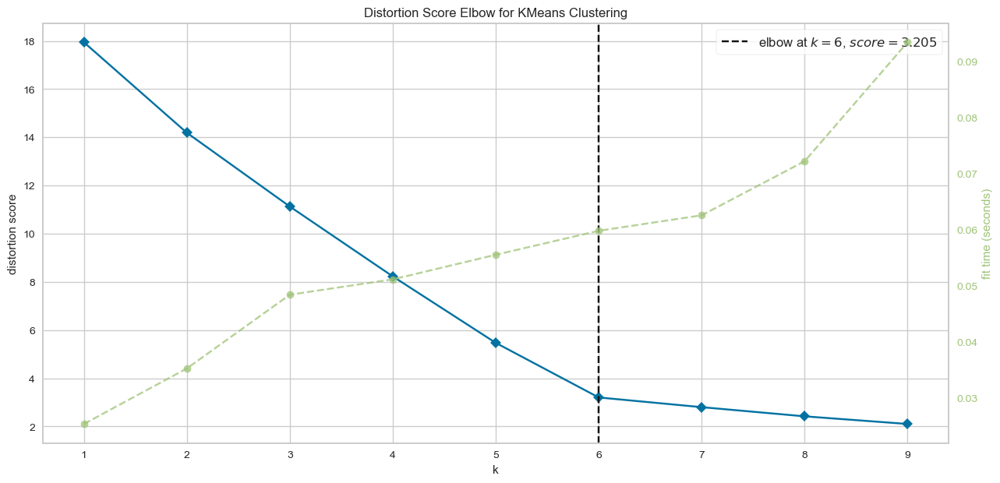

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [44]:
kmeans = KMeans(n_clusters=5, random_state=42)

vis_elbow = KElbowVisualizer(kmeans, k = (1, 10))
vis_elbow.fit(X_kernel_pca)
vis_elbow.poof()

- Optimum number of cluster here is 6

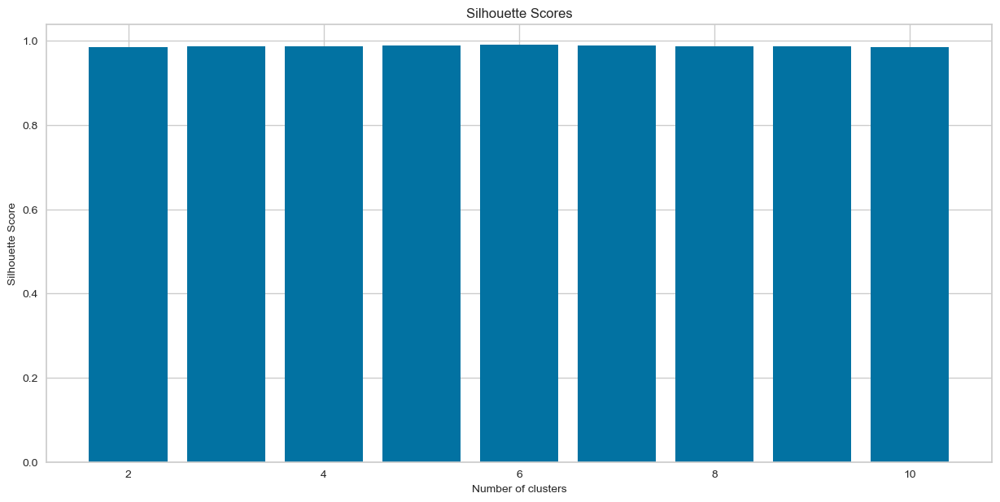

In [45]:
silhouette_scores = [] 

for n_cluster in range(2 , n_clusters+1):

  kmeans = KMeans(n_cluster, random_state=0)

  labels = kmeans.fit_predict(X_kernel_pca)

  silhouette_scores.append(silhouette_score(X_kernel_pca, labels))
    
plt.bar(range(2 , n_clusters+1), silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10)
plt.title('Silhouette Scores')
plt.show()

- Silhouette score is almost equal in all different number of clusters

In [46]:
# Convert to dataframe
component_names = [f"PC{i+1}" for i in range(X_kernel_pca.shape[1])]

X_kernel_pca = pd.DataFrame(X_kernel_pca, columns=component_names)

X_kernel_pca.head()

,PC1,PC2,PC3,PC4,PC5
0,-0.001214,-0.001281,0.000018,-0.000879,-0.000186
1,-0.001214,-0.001281,0.000018,-0.000879,-0.000186
2,-0.001297,-0.001396,0.000020,-0.000969,-0.000208
3,-0.001215,-0.001281,0.000018,-0.000879,-0.000186
4,-0.001231,-0.001303,0.000018,-0.000896,-0.000190


In [47]:
kmeans = KMeans(n_clusters = 5, random_state=42)

pca_labels = kmeans.fit_predict(X_kernel_pca)

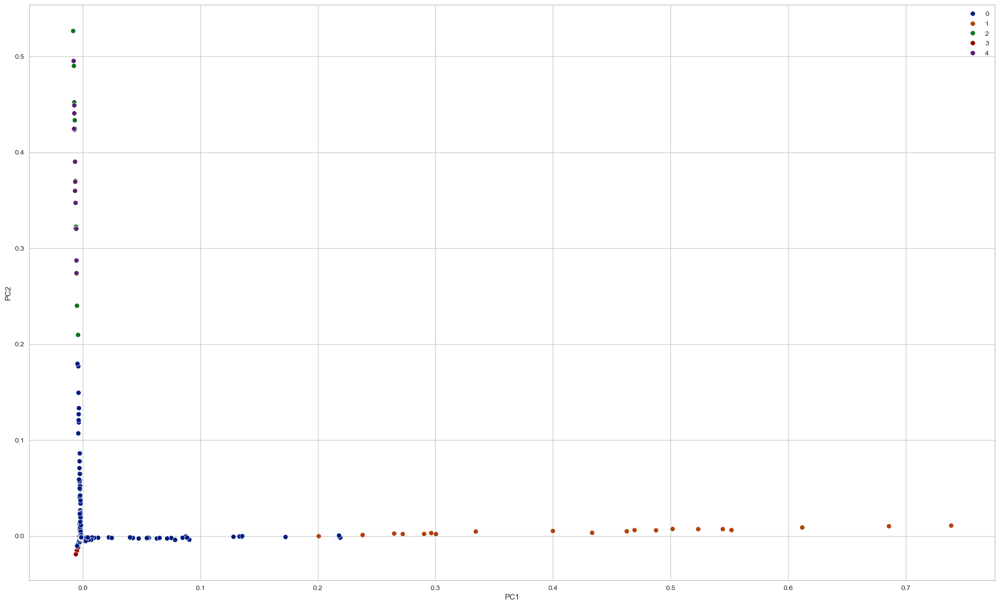

In [48]:
plt.figure(figsize=(25,15))

ax = sns.scatterplot(x= X_kernel_pca["PC1"], y= X_kernel_pca["PC2"], hue = pca_labels, data = X_kernel_pca, palette='dark')
plt.show()

- It doesn't look good in my preprocessing

## KMeans with PCA

In [49]:
pca = PCA(n_components = 5 )

X_pca = pca.fit_transform(df_copy)

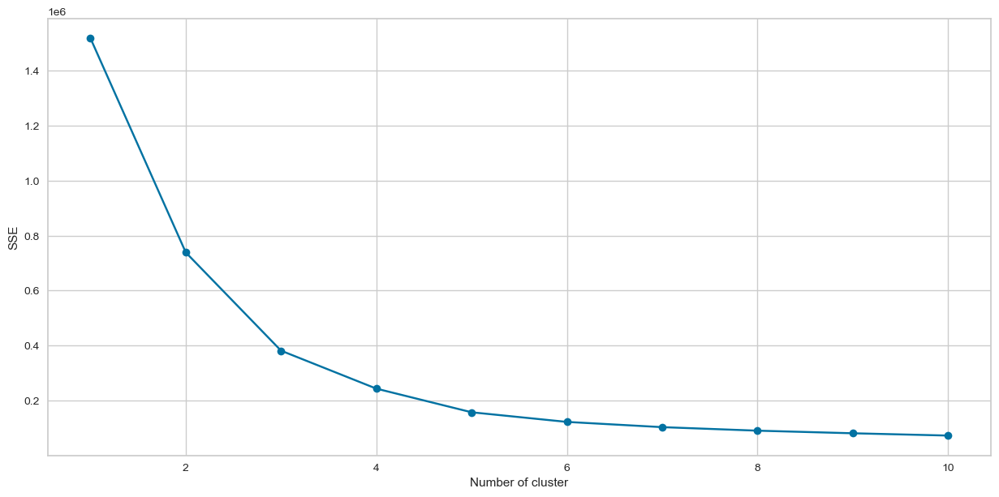

In [50]:
n_clusters = 10

inertias = []

for n_cluster in range(1 , n_clusters+1):

    kmean= KMeans(n_cluster, random_state=0)

    kmean.fit(X_pca)

    inertias.append(kmean.inertia_)

plt.plot(range(1 , n_clusters+1), inertias, '-o')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()    

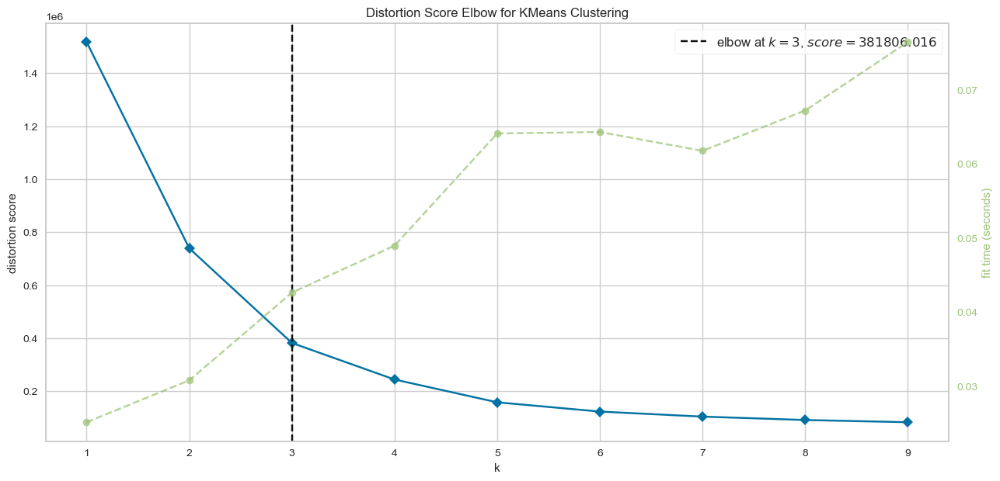

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [51]:
kmeans = KMeans(n_clusters=5, random_state=42)

vis_elbow = KElbowVisualizer(kmeans, k = (1, 10))
vis_elbow.fit(X_pca)
vis_elbow.poof()

- It seems here from the graph that number of cluster is about 4.

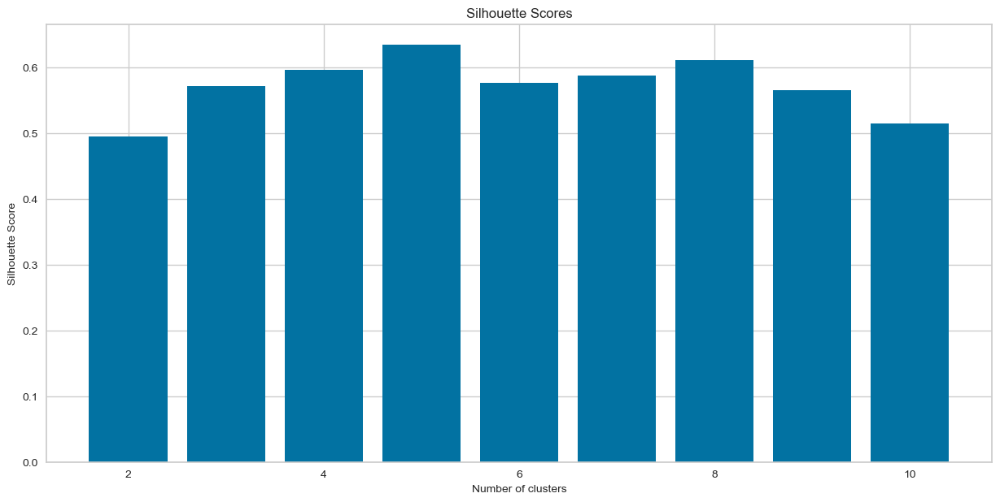

In [52]:
silhouette_scores = [] 

for n_cluster in range(2 , n_clusters+1):

  kmeans = KMeans(n_cluster, random_state=0)

  labels = kmeans.fit_predict(X_pca)

  silhouette_scores.append(silhouette_score(X_pca, labels))
    
plt.bar(range(2 , n_clusters+1), silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10)
plt.title('Silhouette Scores')
plt.show()

- From Silhouette score the best score at k=5
- Same Results appear when Using PCA but with Smaller SSE and Increased Silhouette Scores.

In [53]:
# Convert to dataframe
component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]

X_pca = pd.DataFrame(X_pca, columns=component_names)

X_pca.head()

,PC1,PC2,PC3,PC4,PC5
0,-7.497438,-3.852236,-3.998516,-2.625111,2.975387
1,17.193458,-1.741983,-3.011453,3.535256,-3.392580
2,-4.140982,-6.936565,8.961808,-2.390380,-1.088761
3,-1.318598,-9.408904,5.074237,-2.317304,-0.372652
4,-10.068735,-0.347404,-3.574673,-4.414946,0.262985


In [54]:
kmeans = KMeans(n_clusters = 5, random_state=42)

pca_labels = kmeans.fit_predict(X_pca)

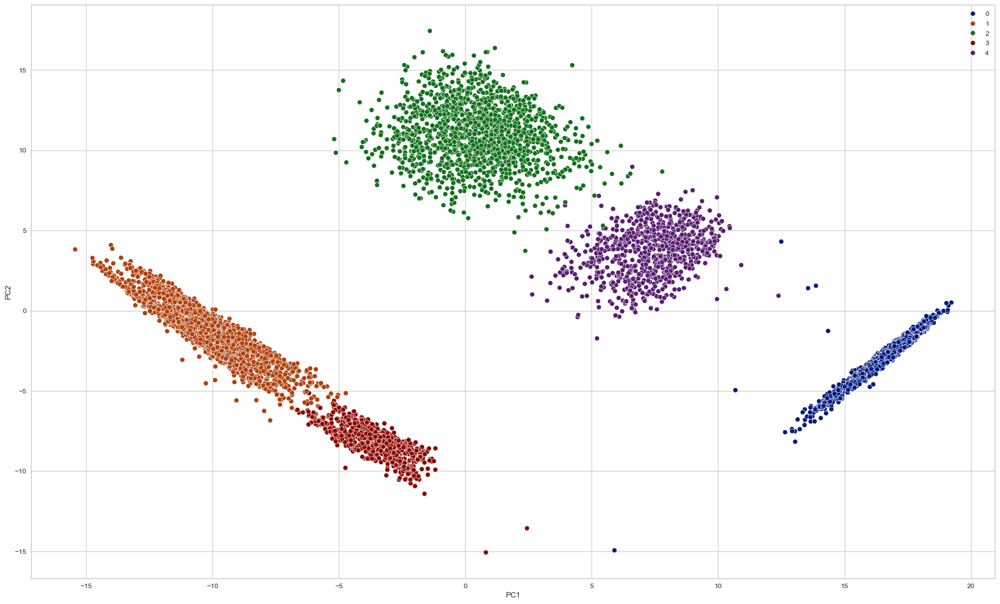

In [55]:
plt.figure(figsize=(25,15))

ax = sns.scatterplot(x= X_pca["PC1"], y= X_pca["PC2"], hue = pca_labels, data = X_pca, palette='dark')
plt.show()

- So, the best model is the Kmeans with PCA

In [56]:
kmeans = KMeans(n_clusters=5, random_state=42)

data_label = kmeans.fit_predict(df_copy)

In [57]:
df_copy["Clusters"] = data_label

df_copy["Clusters"] = df_copy["Clusters"].astype('category')

df_copy

,BALANCE,BALANCE_FREQUENCY,PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Clusters
0,3.711173,-0.199449,4.558089,4.558089,-6.907755,0.166667,-6.907755,-6.907755,0.693647,6.907756,5.307292,4.938142,-6.907755,12,1
1,8.071677,-0.094211,-6.907755,-6.907755,8.770741,0.000000,-6.907755,1.386544,-6.907755,8.853666,8.319482,6.977600,-1.499588,12,0
2,7.822104,0.001000,6.650500,-6.907755,-6.907755,1.000000,0.001000,-6.907755,2.484990,8.922658,6.433049,6.441402,-6.907755,12,4
4,6.706514,0.001000,2.772651,-6.907755,-6.907755,0.083333,-2.472982,-6.907755,0.001000,7.090078,6.519642,5.500410,-6.907755,12,4
5,7.500988,0.001000,7.195398,7.195398,-6.907755,0.666667,-6.907755,-6.907755,2.079567,7.495542,7.244269,7.786239,-6.907755,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,1.770317,-0.691149,3.039797,-6.907755,-6.907755,0.166667,-1.785775,-6.907755,0.001000,6.214610,4.071517,3.772180,-6.907755,6,4
8945,3.349712,0.001000,5.673739,5.673739,-6.907755,1.000000,-6.907755,-6.907755,1.791926,6.907756,5.785656,3.889519,-0.691149,6,1
8947,3.152722,-0.181123,4.972594,4.972594,-6.907755,0.833333,-6.907755,-6.907755,1.609638,6.907756,4.397799,4.411820,-1.382302,6,1
8948,2.599616,-0.181123,-6.907755,-6.907755,3.598949,0.000000,-6.907755,0.693647,-6.907755,6.214610,3.961783,4.020996,-1.382302,6,0


<Figure size 2000x3500 with 0 Axes>

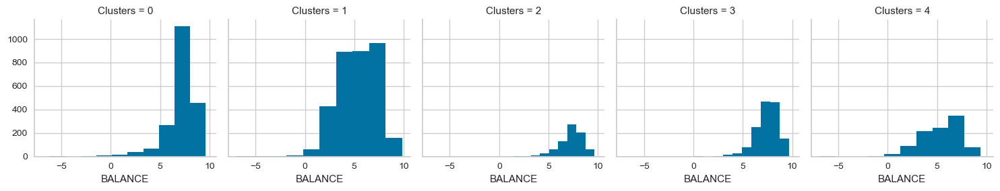

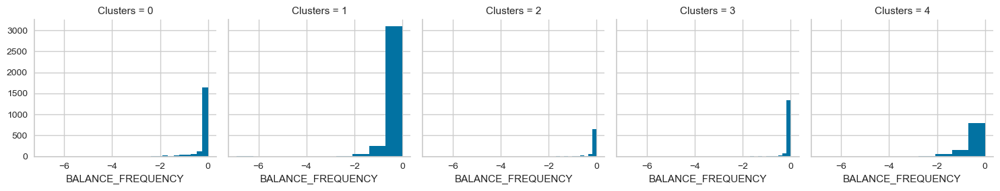

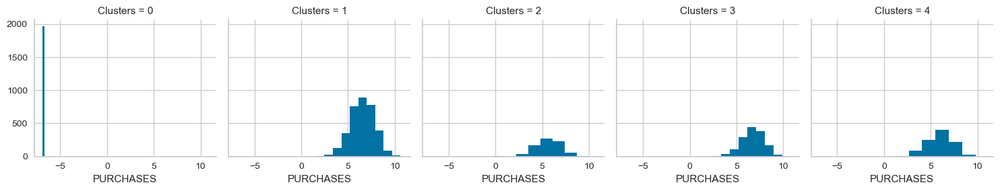

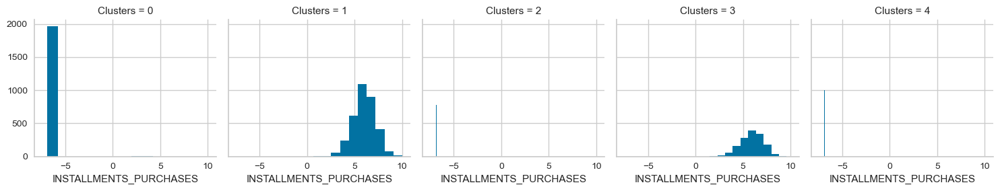

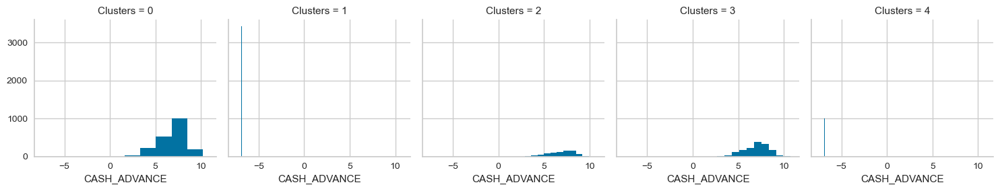

...

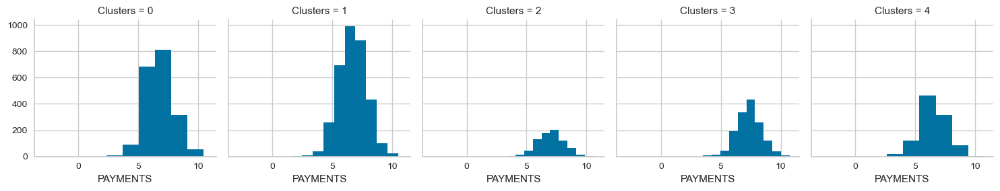

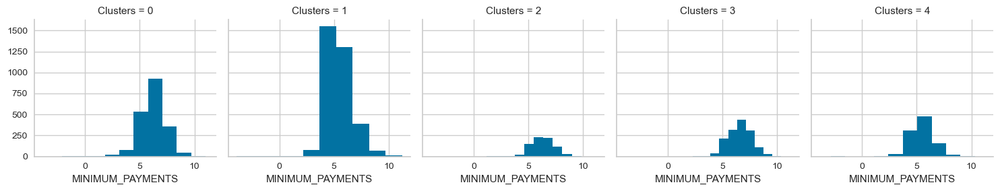

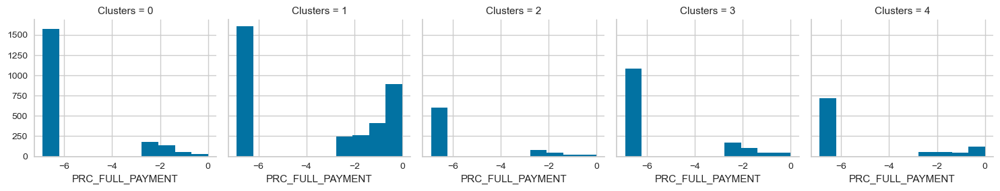

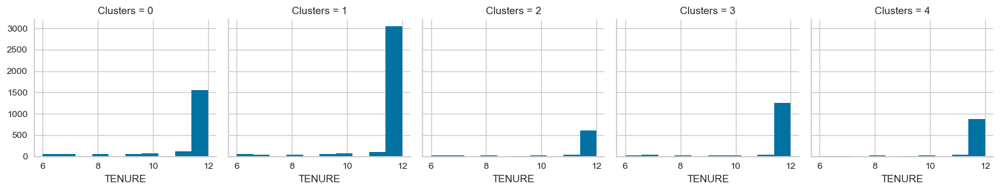

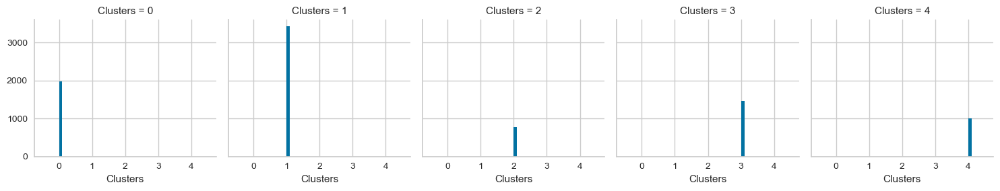

In [58]:
plt.figure(figsize=(20,35))

for col in df_copy.columns:

    grid = sns.FacetGrid(df_copy, col='Clusters')

    grid.map(plt.hist, col)
    
    plt.show()

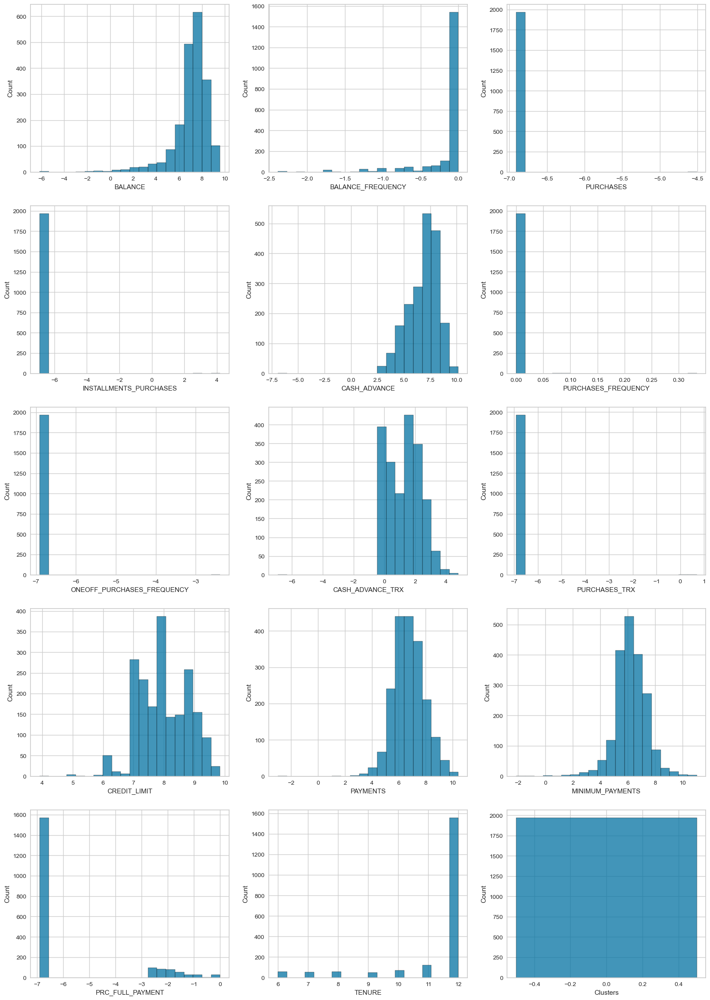

In [59]:
plt.figure(figsize=(20,35))

for i, col in enumerate(df_copy.columns):

        ax = plt.subplot(6, 3, i+1)

        sns.histplot( x = col , ax=ax , bins=20 , data = df_copy[df_copy['Clusters'] == 0])

        plt.xlabel(col)
        
plt.show()

In [60]:
df_final = df.copy()
df_final.dropna(inplace=True)
df_final.drop(columns=['CUST_ID'],inplace=True)
df_final['Cluster'] = hier_model.labels_

In [61]:
cols = ['PURCHASES', 'ONEOFF_PURCHASES' ,'PURCHASES_FREQUENCY','PAYMENTS', 'CASH_ADVANCE','CREDIT_LIMIT' ,'INSTALLMENTS_PURCHASES', 'PURCHASES_TRX', 
        'CASH_ADVANCE_TRX', 'CASH_ADVANCE_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'TENURE']

df_final.groupby('Cluster')[cols].mean()

,PURCHASES,ONEOFF_PURCHASES,PURCHASES_FREQUENCY,PAYMENTS,CASH_ADVANCE,CREDIT_LIMIT,INSTALLMENTS_PURCHASES,PURCHASES_TRX,CASH_ADVANCE_TRX,CASH_ADVANCE_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,TENURE
Cluster,,,,,,,,,,,,,,
0,1528.079115,766.787492,0.764942,1554.026491,0.000000,4430.048234,761.836169,23.494015,0.000000,0.000000,0.233335,0.663951,0.000000,11.658102
1,1501.831313,801.131614,0.740781,2708.601191,2080.542106,5366.218270,701.114172,24.858413,7.273598,0.282638,0.273117,0.622789,0.282638,11.528728
2,0.001050,0.001050,0.000215,1712.802896,2011.201239,4053.483849,0.044115,0.004566,6.410452,0.276716,0.000215,0.000127,0.276716,11.360223
3,903.747266,903.840636,0.362724,1212.595351,0.000000,4420.388276,0.000000,8.010934,0.000000,0.000000,0.362062,0.000331,0.000000,11.609344
4,669.853329,669.898303,0.278736,1985.015233,2046.463232,4660.783090,0.000000,6.410622,6.930052,0.297572,0.278628,0.000000,0.297572,11.343264


## Clusters from business point of view

- Cluster 0:
    - This cluster seems to have high values for features like ‘PURCHASES’, ‘PAYMENTS’, ‘CREDIT LIMIT’, and ‘PURCHASES TRX’ . This could indicate customers who tend to spend a lot, possibly using credit cards frequently. They might be high-value customers but also a risk for credit delinquencies.

- Cluster 1:
    - Customers in this cluster also have high ‘PURCHASES’ and ‘PAYMENTS’ but even higher ‘CREDIT LIMIT’ and ‘INSTALLMENTS_PURCHASES’ compared to cluster 0. This suggests they might be making larger purchases financed through installments.

- Cluster 2:
    - This cluster has very low values for most features except for ‘PAYMENTS’ which is high. This could be due to a pre-payment made towards a large outstanding balance.

- Cluster 3:
    - Customers here seem to have low ‘PURCHASES’ , low ‘PAYMENTS’, and no ‘CASH ADVANCE’ or ‘INSTALLMENTS_PURCHASES’. This might indicate infrequent or low spending customers.

- Cluster 4:
    - This cluster has low values for most features similar to cluster 3, but slightly higher ‘PURCHASES’ and ‘PAYMENTS’. They might be low spending customers but spend more regularly compared to cluster 3.